In [11]:
using JuMP, CPLEX
model = Model(CPLEX.Optimizer)
set_attribute(model, "CPX_PARAM_EPINT", 1e-8)
using Printf
using Plots
using Random
using ColorTypes

# Function to calculate Euclidean distance
function calculate_distance(x1, y1, x2, y2)
    return sqrt((x1 - x2)^2 + (y1 - y2)^2)
end

# Function to calculate distance matrix
function calculate_distance_matrix(x,y,nc)
    distances = zeros(length(x),length(x))
    for i in 1:length(x)
        for j in 1:length(y)
            if(i==j)
                distances[i,j] = 10000.00
            elseif((i==1 || j==1)&&(length(x)-i<nc || length(y)-j<nc))
                distances[i, j] = 10000.00
            else
                distances[i, j] = (calculate_distance(x[i], y[i], x[j], y[j]))
            end
        end
    end
    
    return distances

end

function generate_rgb_colors(l::Int)
    colors = [RGB(rand(), rand(), rand()) for _ in 1:l]
    return colors
end
# Define a structure for the customer data
struct Customer
    cust_no::Int
    xcoord::Int
    ycoord::Int
    demand::Int
    ready_time::Int
    due_date::Int
    service_time::Int
end


function displayMap()
    node_labels = [string("N.", i) for i in N]
    # demand_labels = [string("D= ", demands[i-1-np]," TW= ",time_windows[i-1-np]) for i in C]
    demand_labels = [string("D= ", demands[i-1-np]) for i in C]
   
    default(size=(800, 600))
    gr()
    
    # Create a customers scatter plot
    scatter(x_coor_customers, y_coor_customers,
                   title = "Coordinate Plot",
                   xlabel = "X-axis",
                   ylabel = "Y-axis",
                   legend = false, markersize = 6, markercolor = :pink, 
                   marker=:utriangle, markerstrokecolor = :transparent, 
                   markerstrokewidth=0, label = "Customers")

    # Create a parking scatter plot
    scatter!(x_coor[2:1+np], y_coor[2:1+np], 
            title = "Coordinate Plot",
            xlabel = "X-axis", ylabel = "Y-axis",
            legend = false)
 
    # Add the depot point in a different color
    scatter!([x_coor[1]], [y_coor[1]], 
             markersize = 8, markercolor = :yellow)
   
    # Add the initial parking place in a different color
    for p in P
        if PI[p-1]==1
            scatter!([x_coor[p]], [y_coor[p]], 
                 markersize = 8, markercolor = :blue)
        else
            scatter!([x_coor[p]], [y_coor[p]], 
             markersize = 6, markercolor = :white)
        end
    end

    # Add demand annotations for each node
    for i in 1:length(x_coor)
        annotate!(x_coor[i], y_coor[i]+0.3, text(node_labels[i], :center, 4))
        if i<= nc
            # annotate!(x_coor[i+1+np], y_coor[i+1+np]-0.3, text(demand_labels[i], :center, 3)) 
        end
    end 
plot!()
end


function readFile(file_path)
    # Specify the file path
    

    # Read the file lines
    lines = open(file_path, "r") do file
        readlines(file)
    end

    # Find the index where the customer data starts
    start_index = findfirst(contains.(lines, "CUST NO.")) + 1

    x_coor_customers = []
    x_coor_depot = []
    y_coor_customers = []
    y_coor_depot = []
    demands = []
    time_windows = []
    zeta = 0

    # Parse the customer data
    customers = []
    for i in start_index+1:length(lines)
        line = strip(lines[i])
        if !isempty(line)
            fields = split(line)
            # Depot
            if i == start_index + 1
                push!(x_coor_depot, parse(Int, fields[2]))
                push!(y_coor_depot, parse(Int, fields[3]))
                zeta = parse(Int, fields[6])
            else
                # Customers
                customer = Customer(
                    parse(Int, fields[1]),
                    parse(Int, fields[2]),
                    parse(Int, fields[3]),
                    parse(Int, fields[4]),
                    parse(Int, fields[5]),
                    parse(Int, fields[6]),
                    parse(Int, fields[7])
                )
                push!(customers, customer)
            end
        end
    end
    
    # Fill in the attributes
    for customer in customers
        push!(x_coor_customers, customer.xcoord)
        push!(y_coor_customers, customer.ycoord)
        push!(demands, customer.demand)
        push!(time_windows, (customer.ready_time, customer.due_date))
    end
    
    # Generate parkigns
        # nb_clusters = Int(round(length(x_coor_customers)/10)) 
    x_coor_parkings = [rand(x_coor_customers) for _ in 1:15]
    y_coor_parkings = [rand(y_coor_customers) for _ in 1:15]
    
    # Generate centers of clusters
    # result = kmeans(customer_coor', nb_clusters)
    # x_coor_parkings = vcat(x_coor_current_MM,result.centers[1,:])
    # y_coor_parkings = vcat(y_coor_current_MM,result.centers[2,:])

    return x_coor_customers, y_coor_customers, 
            x_coor_depot, y_coor_depot, 
            x_coor_parkings, y_coor_parkings, 
            demands, time_windows, zeta
    
end

readFile (generic function with 1 method)

100


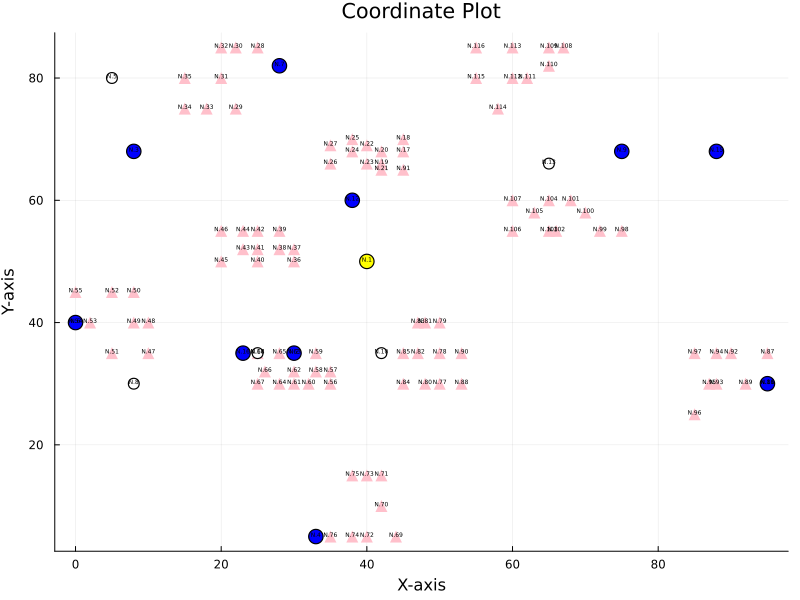

In [9]:
#================================SET=========================================#
x_coor_customers, y_coor_customers, 
  x_coor_depot, y_coor_depot, 
  x_coor_parkings, y_coor_parkings, 
  demands, 
  time_windows, zeta = readFile( "../TestV1/100/C101.txt")

# Number of customers
nc = length(x_coor_customers)
# Number of parking places
np = length(x_coor_parkings)
P = 2 : np+1 #Set of parking place
C = np+2 : np+nc+1 #Set of customers
A1 = 1 : 1+np #Set of FE arcs
A2 = 2 : 1+np+nc #Set of SE arcs
V1 = 1:1 #Set of FEV
V2 = 1:10 #Set of SEV
N = 1:np+nc+1 #Set of nodes

#==============================PARAMETER=====================================#
Q0 = 2000 #Capacity of FEV
Q1 = 200 #Capacity of MM
Q2 = 50 #Capacity of SEV
M = 10000
PI = vcat(ones(Int, 10), zeros(Int, 5)) #Initial parking indicator
shuffle!(PI)
eta1 = 2
eta2 = 1

x_coor = vcat(x_coor_depot, x_coor_parkings, x_coor_customers)
y_coor = vcat(y_coor_depot, y_coor_parkings, y_coor_customers)

node_labels = [string("N.", i) for i in N]
demand_labels = [string(demands[i-1-np]," ",time_windows[i-1-np]) for i in C]

# Disatance matrix
distances = calculate_distance_matrix(x_coor,y_coor,nc)
Vitesse1 = 2
Vitesse2 = 1
println(" ")
TT1 = (distances / Vitesse1)
TT2 = (distances / Vitesse2)

displayMap()


In [78]:
#=========================================================================#
model=Model(CPLEX.Optimizer)

# Decision variable
@variable(model, x[A1,A1], Bin)#Arc(x,y) traversed by FEV
@variable(model, y[A1,A1], Bin)#Arc(x,y) traversed by MM
for i in 1:np+1
    @constraint(model, x[i, i] == 0)
    @constraint(model, y[i, i] == 0)
end

@variable(model, t[A2]>=0, Int) #Arrival time

@variable(model, w[P]>=0, Int) #Amount of freight transported from the depot to parking node

@variable(model, z[V2,A2,A2], Bin)#Arc(x,y) traversed by SEV
for m in V2
    for i in A2
        @constraint(model, z[m,i,i] == 0)
        for j in A2
            if i in P && j in P
                @constraint(model, z[m,i,j]==0)
            end
        end
    end
end

@variable(model, f[A2,A2]>=0,Int) #Load of SEV
#=================================================================================================#
@objective(model, Min,
    sum(distances[i, j] * x[i, j] for i in A1, j in A1 if i != j) +
    sum(distances[i, j] * y[i, j] for i in A1, j in A1 if i != j) +
    sum(sum(distances[i, j] * z[r, i, j] for i in A2, j in A2 if i != j) for r in V2))
#=================================================================================================#

#1 #2
#Flow conservation at parking for FEV
@constraint(model, [i in P], sum(x[j,i] for j in A1 if i != j) == sum(x[i,j] for j in A1 if i != j))
@constraint(model, [i in P], sum(x[i,j] for j in A1 if i != j) <= 1)
#3
#Flow conservation of MM
@constraint(model, [i in P], sum(y[i,j] for j in A1 if i != j) + sum(y[j,i] for j in A1 if i != j)<=1)
#4
#Limit for mobile microhub
@constraint(model, [i in A1, j in A1], y[i,j] <= x[i,j])

#5 #6
#Flow conservation at depot
@constraint(model, sum(x[1,j] for j in A1 if j !=1)==1)
@constraint(model, sum(x[j,1] for j in A1 if j !=1)==1)
@constraint(model, [i in A1], y[1,i] ==0)
@constraint(model, [i in A1], y[i,1] ==0)

#7
#Capacity limit for FEV
@constraint(model, sum(w[p] for p in P)<=Q0)

#8
#Can't tow a MM from parking without MM
@constraint(model, [i in P], sum(y[i,j] for j in A1)<= PI[i-1])
#9
#Can't tow a MM to a parking occupied
@constraint(model, [j in P], sum(y[i,j] for i in A1)<=1-PI[j-1])
#10
#If MM leaves a site, the freight to the site should be zero, otw could be positive
@constraint(model, [p in P], w[p]<=Q1*(1-sum(y[p,j] for j in A1)))

#11
#Link 1st and 2nd
@constraint(model, [p in P], w[p] == sum(f[p,j] for j in A2 if p !=j))

#12
#Capacity limit for MM and connection of FEV
@constraint(model, [p in P], w[p] <= Q1*sum(x[i,p] for i in A1))
#13
#Can't distribute from a site without MM
@constraint(model, [p in P], w[p]<=Q1*(sum(y[i,p] for i in A1)+PI[p-1]))

#14
#Flow consercvation at parking and customer for SEV
@constraint(model, [i in A2, r in V2], sum(z[r,i,j] for j in A2) == sum(z[r,j,i] for j in A2))
#15
#Number of vehicles depart from a Parking node
@constraint(model, [p in P], sum(z[r,p,j] for j in A2 for r in V2) <= length(V2))
#16
#Flow conservation at customer node for SEV
@constraint(model, [i in C], sum(z[r,i,j] for j in A2 for r in V2) == 1)
#17
#Each SEV departs from parking node at most once
@constraint(model, [r in V2, p in P], sum(z[r,p,j] for j in A2) <= 1)
#18
#Customer demand met
@constraint(model, [i in C], sum(f[j,i] for j in A2)-sum(f[i,j] for j in A2)==demands[i-1-np])
#19
#Connection and capacity limit for SEV
@constraint(model, [i in A2, j in A2], f[i,j] <= Q2 * sum(z[r,i,j] for r in V2))

#20
@constraint(model, sum(TT1[i,j]*x[i,j] for i in A1 for j in A1) + eta1*sum(PI[p-1]*x[i,p] for p in P for i in A1)<= zeta)

#21
@constraint(model, [i in C, j in P, r in V2], t[i]+TT2[i,j]+eta2 <= zeta + M*(1 - z[r,i,j]))
#22
#Time constraint for FEV and MTZ
@constraint(model, [i in P, j in P], t[i] + eta1*(1-x[i,j]) + TT1[i,j]*x[i,j] <= t[j] + M*(1 - x[i,j]))

#23
#Time constraint for SEV and MTZ
@constraint(model, [i in C, j in C, r in V2], t[i]+eta2*(1-z[r,i,j])+TT2[i,j]*z[r,i,j] <= t[j]+M * (1 - z[r,i,j]))

#24
@constraint(model, [i in C], t[i] >= time_windows[i-1-np][1])
@constraint(model, [i in C], t[i] <= time_windows[i-1-np][2])

#25 26
#Arrival time initialization
@constraint(model, [i in P], TT1[1,i] * x[1,i] <= t[i])
@constraint(model, [p in P, j in C, r in V2], t[p] + TT2[p,j] * z[r,p,j] <= t[j])

3-dimensional DenseAxisArray{ConstraintRef{Model, MathOptInterface.ConstraintIndex{MathOptInterface.ScalarAffineFunction{Float64}, MathOptInterface.LessThan{Float64}}, ScalarShape},3,...} with index sets:
    Dimension 1, 2:5
    Dimension 2, 6:78
    Dimension 3, 1:10
And data, a 4×73×10 Array{ConstraintRef{Model, MathOptInterface.ConstraintIndex{MathOptInterface.ScalarAffineFunction{Float64}, MathOptInterface.LessThan{Float64}}, ScalarShape}, 3}:
[:, :, 1] =
 t[2] - t[6] + 26.248809496813376 z[1,2,6] ≤ 0  …  t[2] - t[78] + 43.01162633521314 z[1,2,78] ≤ 0
 t[3] - t[6] + 54.120236510939236 z[1,3,6] ≤ 0     t[3] - t[78] + 73.824115301167 z[1,3,78] ≤ 0
 t[4] - t[6] + 31.76476034853718 z[1,4,6] ≤ 0      t[4] - t[78] + 45.27692569068709 z[1,4,78] ≤ 0
 t[5] - t[6] + 48.25971404805462 z[1,5,6] ≤ 0      t[5] - t[78] + 66.70832032063167 z[1,5,78] ≤ 0

[:, :, 2] =
 t[2] - t[6] + 26.248809496813376 z[2,2,6] ≤ 0  …  t[2] - t[78] + 43.01162633521314 z[2,2,78] ≤ 0
 t[3] - t[6] + 54.120236510939236 

In [ ]:
# set_optimizer_attribute(model, "CPX_PARAM_TILIM", 3600)
# Solve the model
optimize!(model)

# Check solution status and display results
if termination_status(model) == MOI.OPTIMAL#|| status == MOI.TIME_LIMIT
    println("Total distance traveled: ", objective_value(model))
else
    println("No feasible solution found.")
end

In [ ]:
displayMap()

if termination_status(model) == MOI.OPTIMAL
    time_labels = [string("t= ", round(value(t[i]))) for i in A2]
    SEV_labels = [string("z(",r,",",i,",",j,")= ", round(value(z[r,i,j]))) for r in V2 for i in A2 for j in A2]
    light_green = RGBA(0.5, 1.0, 0.5, 1.0)
    color_list = generate_rgb_colors(length(V2))
    # Add FEV arcs between the locations if they are traversed
    for i in A1
        for j in A1         
            if round(value(y[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = light_green, label = "", linealpha=4, lw=4)
            end
            if round(value(x[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = :red, label = "")
            end
        end
    end
    
    # Add SEV arcs between the locations if they are traverse
    for r in V2
        for i in A2
            if value(t[i])!=0 annotate!(x_coor[i]+0.5, y_coor[i], text(time_labels[i-1], :center, 6)) end
            for j in A2
                if round(value(z[r, i, j])) == 1
                    plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], line=:arrow, color = color_list[r] )
                    mid_x = (x_coor[i] + x_coor[j]) / 2 
                    mid_y = (y_coor[i] + y_coor[j]) / 2 + 0.2
                    annotate!(mid_x, mid_y, text(SEV_labels[(r-1)*(np+nc)*(np+nc)+(i-2)*(np+nc)+j-1],6 ,:blue))
                    if value(f[i,j]) != 0
                        mid_x = (x_coor[i] + x_coor[j]) / 2
                        mid_y = (y_coor[i] + y_coor[j]) / 2 - 0.2
                    end
                end
            end
        end
    end
end
plot!()

In [ ]:
for i in A1
    for j in A1 if round(value(x[i,j]))==1 print("  x[",i,",",j,"]=",round(value(x[i,j]))) end end
end
println(" ")
for i in A1
    for j in A1 if value(y[i,j])==1 print("  y[",i,",",j,"]=",value(y[i,j])) end end
end
println(" ")
for i in A2 print("  t[",i,"]=",value(t[i])) end
println(" ")
for r in V2
    for i in A2
        for j in A2 if round(value(z[r,i,j]))==1 print("  z[",r,",",i,",",j,"]=",round(value(z[r,i,j]))) end end
    end
    println("") 
    println("")
end
println(" ")
for i in P
    print("  w[",i,"]=",value(w[i]))
end
println(" ")
for i in A2
    for j in A2 if value(f[i,j]) != 0 print("  f[",i,",",j,"]=",value(f[i,j])) end end
end

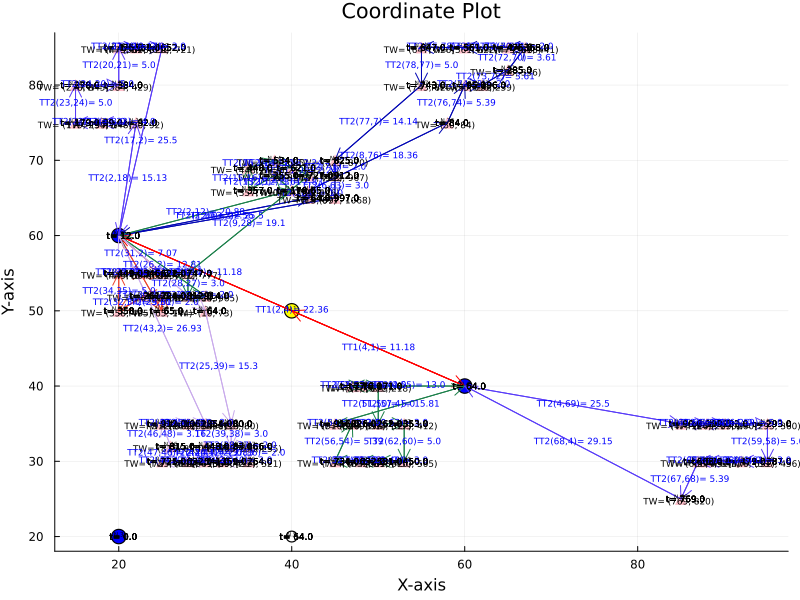

In [49]:
displayMap()
speed1_labels = [string("TT1(",i,",",j,")= ", round(value(TT1[i,j]), digits=2)) for i in N for j in N]
speed2_labels = [string("TT2(",i,",",j,")= ", round(value(TT2[i,j]), digits=2)) for i in N for j in N]
demand_labels = [string("TW= ",time_windows[i-1-np]) for i in C]

for i in C
    annotate!(x_coor[i]-0.3, y_coor[i]-0.3, text(demand_labels[i-1-np], :center, 6)) 
end 

if termination_status(model) == MOI.OPTIMAL
    time_labels = [string("t= ", round(value(t[i]))) for i in A2]
    SEV_labels = [string("z(",r,",",i,",",j,")= ", round(value(z[r,i,j]))) for r in V2 for i in A2 for j in A2]
    light_green = RGBA(0.5, 1.0, 0.5, 1.0)
    color_list = generate_rgb_colors(length(V2))
    # Add FEV arcs between the locations if they are traversed
    for i in A1
        for j in A1         
            if round(value(y[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = light_green, label = "", linealpha=4, lw=4)
            end
            if round(value(x[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = :red, label = "")
                mid_x = (x_coor[i] + x_coor[j]) / 2
                mid_y = (y_coor[i] + y_coor[j]) / 2 +0.2
                annotate!(mid_x, mid_y, text(speed1_labels[(i-1)*(np+nc+1)+j],6 ,:blue))
            end
        end
    end
    
    # Add SEV arcs between the locations if they are traverse
    for r in V2
        for i in A2
            annotate!(x_coor[i]+0.5, y_coor[i], text(time_labels[i-1], :center, 6))
            for j in A2
                if round(value(z[r, i, j])) == 1
                    plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], line=:arrow, color = color_list[r] )
                    mid_x = (x_coor[i] + x_coor[j]) / 2 
                    mid_y = (y_coor[i] + y_coor[j]) / 2 + 0.2
                    # annotate!(mid_x, mid_y, text(SEV_labels[(r-1)*(np+nc)*(np+nc)+(i-2)*(np+nc)+j-1],6 ,:blue))
                    annotate!(mid_x, mid_y, text(speed2_labels[(i-1)*(np+nc+1)+j],6 ,:blue))
                end
            end
        end
    end
end
plot!()

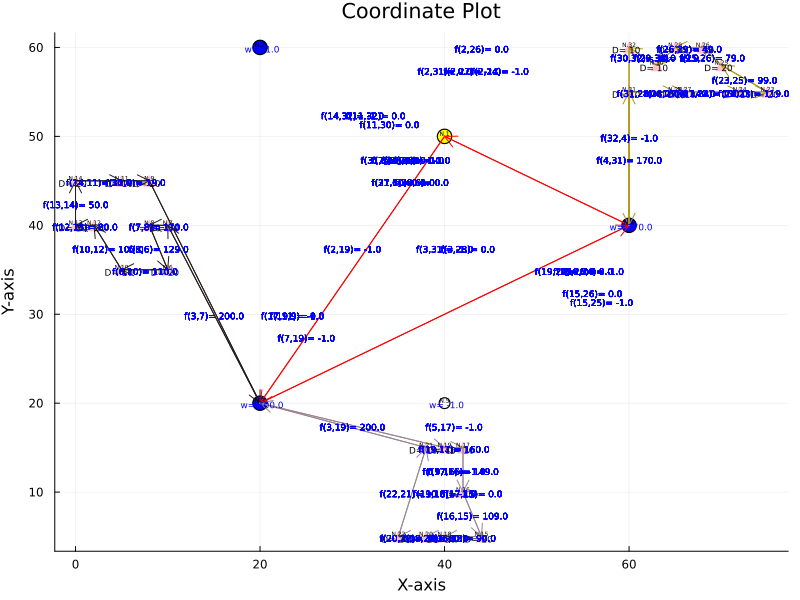

In [197]:
displayMap()
demand_labels = [string("D= ", demands[i-1-np]) for i in C]
for i in C
    annotate!(x_coor[i]-0.3, y_coor[i]-0.3, text(demand_labels[i-1-np], :center, 6)) 
end 


if termination_status(model) == MOI.OPTIMAL
    time_labels = [string("t= ", value(t[i])) for i in A2]
    flow_labels = [string("f(",i,",",j,")= ", floor(value(f[i,j]))) for i in A2 for j in A2]
    loan_labels = [string("w= ", floor(value(w[i]))) for i in P]
    light_green = RGBA(0.5, 1.0, 0.5, 1.0)
    color_list = generate_rgb_colors(length(V2))
    # Add FEV arcs between the locations if they are traversed
    for i in A1
        for j in A1         
            if round(value(y[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = light_green, label = "", linealpha=4, lw=4)
            end
            if round(value(x[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = :red, label = "")
            end
        end
    end
    
    # Add SEV arcs between the locations if they are traverse
    for r in V2
        for i in A2
#             annotate!(x_coor[i]+0.5, y_coor[i], text(time_labels[i-1], :center, 6))
            for j in A2
                if round(value(z[r, i, j])) == 1
                    plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], line=:arrow, color = color_list[r] )
                    mid_x = (x_coor[i] + x_coor[j]) / 2
                    mid_y = (y_coor[i] + y_coor[j]) / 2 + 0.2
#                     annotate!(mid_x, mid_y, text(SEV_labels[(r-1)*(np+nc)*(np+nc)+(i-2)*(np+nc)+j-1],6 ,:blue))
                    
                end
                if value(f[i,j]) != 0
                    mid_x = (x_coor[i] + x_coor[j]) / 2
                    mid_y = (y_coor[i] + y_coor[j]) / 2 - 0.2
                    annotate!(mid_x, mid_y, text(flow_labels[(i-2)*(np+nc)+j-1],6 ,:blue))
                end
            end
        end
    end
    
    for p in P
        annotate!(x_coor[p]+0.2,y_coor[p]-0.2, text(loan_labels[p-1],6 ,:blue))
    end
end
plot!()